In [57]:
import pandas as pd
import numpy as np
from sklearn.cluster import AffinityPropagation, AgglomerativeClustering, k_means
from sklearn_extra.cluster import KMedoids
from sklearn.metrics.cluster import (homogeneity_score, silhouette_score, davies_bouldin_score,
                                     adjusted_rand_score, calinski_harabasz_score, adjusted_mutual_info_score,
                                     v_measure_score, completeness_score)

from sklearn.datasets import make_blobs
from collections import defaultdict
import itertools

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

## Generate dataset

In [3]:
dataset = make_blobs(n_samples=1000, cluster_std=[0.25, 1, 2.5], random_state=42)

In [4]:
data, labels = dataset

# Baseline algorithms

In [5]:
clustering_algorithms = (AffinityPropagation, AgglomerativeClustering, KMedoids, k_means)
clustering_algorithms_titles = ('AffinityPropagation', 'AgglomerativeClustering', 'KMedoids', 'KMeans++')
clustering_metrics = (homogeneity_score, silhouette_score, davies_bouldin_score, adjusted_rand_score, 
                      calinski_harabasz_score, adjusted_mutual_info_score, v_measure_score, completeness_score)
clustering_metrics_titles = ('homogeneity_score', 'silhouette_score', 'davies_bouldin_score',
                             'adjusted_rand_index', 'calinski_harabasz_score', 'adjusted_mutual_info',
                             'v_measure_score', 'completeness_score'
                            )

### Calculate metrics for each algorithm

In [6]:
labels_mapping = {}

metrics_dataframe = pd.DataFrame(index=clustering_algorithms_titles, columns=clustering_metrics_titles)

for clustering_algorithm, clustering_algorithms_title in zip(clustering_algorithms, clustering_algorithms_titles):
    try:
        algorithm = clustering_algorithm()
    except:
        algorithm = clustering_algorithm(data, 2)
    
    try:
        tmp_predictions = algorithm.fit_predict(data)
    except:
        tmp_predictions = algorithm[1]
    
    labels_mapping[clustering_algorithms_title] = tmp_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe.loc[clustering_algorithms_title, metric_title] = metric(labels, tmp_predictions)
        else:
            metrics_dataframe.loc[clustering_algorithms_title, metric_title] = metric(data, labels)

In [7]:
metrics_dataframe.index.name = 'clustering_algorithm'
metrics_dataframe

,homogeneity_score,silhouette_score,davies_bouldin_score,adjusted_rand_index,calinski_harabasz_score,adjusted_mutual_info,v_measure_score,completeness_score
clustering_algorithm,,,,,,,,
AffinityPropagation,3.03171e-16,0.823128,0.269899,0,6612.36,6.06342e-16,6.06342e-16,1
AgglomerativeClustering,0.57917,0.823128,0.269899,0.570571,6612.36,0.733204,0.733512,1
KMedoids,0.995434,0.823128,0.269899,0.639671,6612.36,0.739209,0.740456,0.589466
KMeans++,0.57917,0.823128,0.269899,0.570571,6612.36,0.733204,0.733512,1


In [8]:
def highlight_min(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    data = data.replace('%','', regex=True).astype(float)
    if data.ndim == 1:
        bound = data == data.min() 
        return [attr if row else '' for row in bound]
    else:
        bound = data == data.min().min()  
        return pd.DataFrame(np.where(bound, attr, ''), index=data.index, columns=data.columns)
    
def highlight_max(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    data = data.replace('%','', regex=True).astype(float)
    if data.ndim == 1:
        bound = data == data.max() 
        return [attr if row else '' for row in bound]
    else:
        bound = data == data.max().max()  
        return pd.DataFrame(np.where(bound, attr, ''), index=data.index, columns=data.columns)

In [9]:
metrics_best_mapping = {'davies_bouldin_score': highlight_min,
                       'calinski_harabasz_score': highlight_max,
                       'silhouette_score': highlight_max,
                       'homogeneity_score': highlight_max,
                       'adjusted_rand_index': highlight_max,
                       'adjusted_mutual_info': highlight_max,
                       'v_measure_score': highlight_max,
                       'completeness_score': highlight_max
                       }

metrics_min = ['davies_bouldin_score']
metrics_max = list(set(clustering_metrics_titles) - set(metrics_min))

### Find best algorithms for each metric of clusterization

#### Davies_bouldin_score we have to minimize

In [10]:
metrics_dataframe[metrics_min].style.apply(highlight_min)

,davies_bouldin_score
clustering_algorithm,
AffinityPropagation,0.269899
AgglomerativeClustering,0.269899
KMedoids,0.269899
KMeans++,0.269899


#### Other metrics we have to maximize

In [11]:
metrics_dataframe[metrics_max].style.apply(highlight_max)

,calinski_harabasz_score,adjusted_mutual_info,adjusted_rand_index,homogeneity_score,completeness_score,silhouette_score,v_measure_score
clustering_algorithm,,,,,,,
AffinityPropagation,6612.355083,0.000000,0.000000,0.000000,1.000000,0.823128,0.000000
AgglomerativeClustering,6612.355083,0.733204,0.570571,0.579170,1.000000,0.823128,0.733512
KMedoids,6612.355083,0.739209,0.639671,0.995434,0.589466,0.823128,0.740456
KMeans++,6612.355083,0.733204,0.570571,0.579170,1.000000,0.823128,0.733512


KMedoids seems to be the best algorithm, according to clusterization metrics

### Vizualize clusters for each method

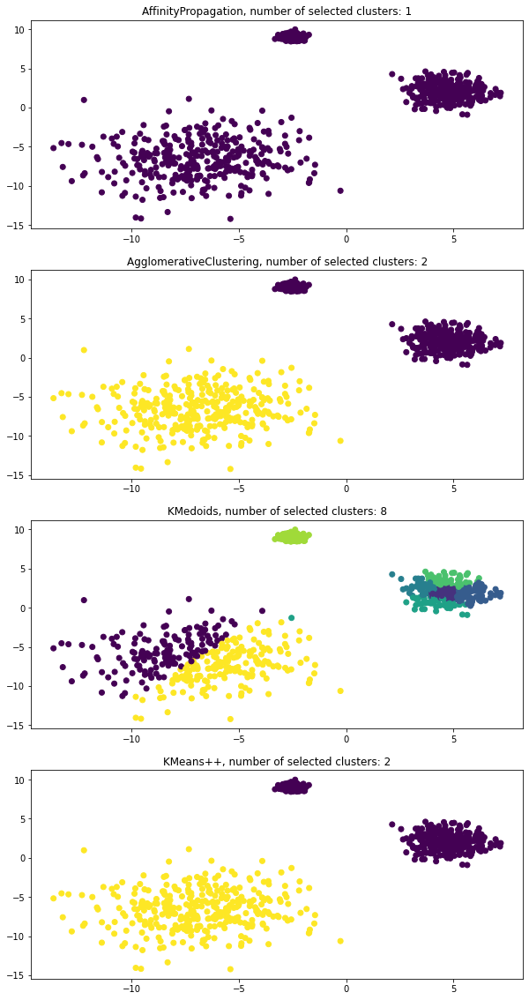

In [12]:
fig, axs = plt.subplots(nrows=len(clustering_algorithms_titles), ncols=1, figsize=(10, 20))

idx = 0

for clustering_algorithm, labels in labels_mapping.items():
    colors_mapping = [(item/255.) for item in labels]
    axs[idx].scatter(data[:, 0], data[:, 1], c=colors_mapping);
    axs[idx].set_title('{}, number of selected clusters: {}'.format(clustering_algorithm, len(set(labels))))
    
    idx += 1

# Experiments with parameters

## KMeans++

#### Experiments with number of clusters

In [13]:
clusters_range = range(2, 10)

In [25]:
kmeans_labels_mapping = {}

metrics_dataframe_kmeans = pd.DataFrame(index=clusters_range, columns=clustering_metrics_titles)

for nclusters in clusters_range:
    algorithm = k_means(data, nclusters)
    kmeans_predictions = algorithm[1]
    
    kmeans_labels_mapping[nclusters] = kmeans_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_kmeans.loc[nclusters, metric_title] = metric(labels, kmeans_predictions)
        else:
            metrics_dataframe_kmeans.loc[nclusters, metric_title] = metric(data, labels)

In [26]:
metrics_dataframe_kmeans.index.name = 'nclusters'
metrics_dataframe_kmeans

,homogeneity_score,silhouette_score,davies_bouldin_score,adjusted_rand_index,calinski_harabasz_score,adjusted_mutual_info,v_measure_score,completeness_score
nclusters,,,,,,,,
2,0.331246,0.535976,0.847492,0.308162,5714.89,0.496057,0.497648,1
3,0.571933,0.535976,0.847492,0.626678,5714.89,0.726214,0.727681,1
4,0.645264,0.535976,0.847492,0.722494,5714.89,0.760946,0.76274,0.932512
5,0.682059,0.535976,0.847492,0.754214,5714.89,0.771832,0.774042,0.894703
6,0.716208,0.535976,0.847492,0.771403,5714.89,0.788022,0.790549,0.88211
7,0.813183,0.535976,0.847492,0.900803,5714.89,0.84004,0.842183,0.873329
8,0.813771,0.535976,0.847492,0.900041,5714.89,0.826462,0.829174,0.845172
9,0.966672,0.535976,0.847492,0.973466,5714.89,0.966982,0.967568,0.968464


### Find best nclusters for each Kmeans++

#### Davies_bouldin_score we have to minimize

In [27]:
metrics_dataframe_kmeans[metrics_min].style.apply(highlight_min)

,davies_bouldin_score
nclusters,
2,0.847492
3,0.847492
4,0.847492
5,0.847492
6,0.847492
7,0.847492
8,0.847492
9,0.847492


#### Other metrics we have to maximize

In [28]:
metrics_dataframe_kmeans[metrics_max].style.apply(highlight_max)

,calinski_harabasz_score,adjusted_mutual_info,adjusted_rand_index,homogeneity_score,completeness_score,silhouette_score,v_measure_score
nclusters,,,,,,,
2,5714.892890,0.496057,0.308162,0.331246,1.000000,0.535976,0.497648
3,5714.892890,0.726214,0.626678,0.571933,1.000000,0.535976,0.727681
4,5714.892890,0.760946,0.722494,0.645264,0.932512,0.535976,0.762740
5,5714.892890,0.771832,0.754214,0.682059,0.894703,0.535976,0.774042
6,5714.892890,0.788022,0.771403,0.716208,0.882110,0.535976,0.790549
7,5714.892890,0.840040,0.900803,0.813183,0.873329,0.535976,0.842183
8,5714.892890,0.826462,0.900041,0.813771,0.845172,0.535976,0.829174
9,5714.892890,0.966982,0.973466,0.966672,0.968464,0.535976,0.967568


Seems like 9 clusters is the best parameter for KMeans++ algorithm

### Vizualize clusters for each parameter

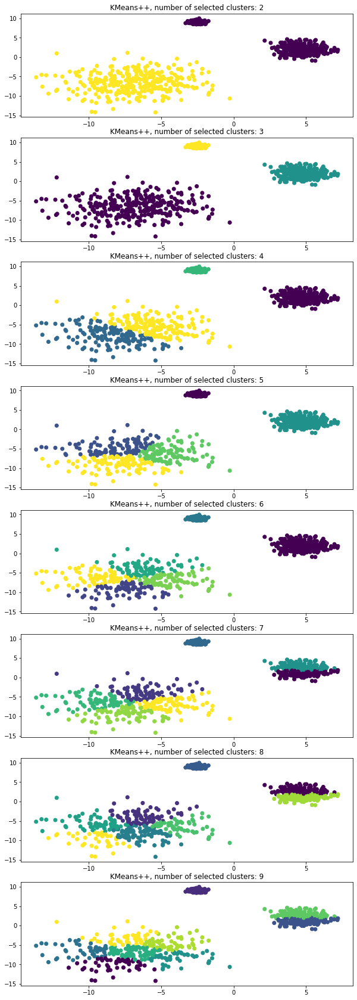

In [29]:
fig, axs = plt.subplots(nrows=len(clusters_range), ncols=1, figsize=(10, 30))

idx = 0

for nclusters, labels in kmeans_labels_mapping.items():
    colors_mapping = [(item/255.) for item in labels]
    axs[idx].scatter(data[:, 0], data[:, 1], c=colors_mapping);
    axs[idx].set_title('KMeans++, number of selected clusters: {}'.format(nclusters, ))
    
    idx += 1

## Agglomerative Clustering

#### Experiments with number of clusters and distance metrics

In [39]:
clusters_range = range(2, 10)
distance_metrics = ('euclidean', 'l1', 'l2', 'manhattan', 'cosine')

In [40]:
agglomerative_clustering_labels_mapping = defaultdict(dict)

index = pd.MultiIndex.from_product((clusters_range, distance_metrics))

metrics_dataframe_agglomerative = pd.DataFrame(index=index, columns=clustering_metrics_titles)

In [41]:
for nclusters, distance_metric in itertools.product(clusters_range, distance_metrics):
    algorithm = AgglomerativeClustering(n_clusters=nclusters, affinity=distance_metric, linkage='average')
    agglomerative_predictions = algorithm.fit_predict(data)
    
    agglomerative_clustering_labels_mapping[nclusters][distance_metric] = agglomerative_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_agglomerative.loc[(nclusters, distance_metric), metric_title] = metric(
                labels, agglomerative_predictions)
        else:
            metrics_dataframe_agglomerative.loc[(nclusters, distance_metric), metric_title] = metric(data, labels)

In [42]:
metrics_dataframe_agglomerative.index.names = ['nclusters', 'affinity']
metrics_dataframe_agglomerative

homogeneity_score silhouette_score davies_bouldin_score  \
nclusters affinity                                                            
2         euclidean           0.33186         0.537148             0.851102   
          l1                  0.33186         0.537148             0.851102   
          l2                  0.33186         0.537148             0.851102   
          manhattan           0.33186         0.537148             0.851102   
          cosine              0.33186         0.537148             0.851102   
3         euclidean          0.572993         0.537148             0.851102   
          l1                 0.572993         0.537148             0.851102   
          l2                 0.572993         0.537148             0.851102   
          manhattan          0.572993         0.537148             0.851102   
          cosine             0.572993         0.537148             0.851102   
4         euclidean            0.5761         0.537148             0.851102   
          l1                 0.574019         0.537148             0.851102   
          l2                   0.5761         0.537148             0.851102   
          manhattan          0.574019         0.537148             0.851102   
          cosine             0.576798         0.537148             0.851102   
5         euclidean           0.57897         0.537148             0.851102   
          l1                 0.590351         0.537148             0.851102   
          l2                  0.57897         0.537148             0.851102   
          manhattan          0.590351         0.537148             0.851102   
          cosine             0.577794         0.537148             0.851102   
6         euclidean          0.592597         0.537148             0.851102   
          l1                  0.60877         0.537148             0.851102   
          l2                 0.592597         0.537148             0.851102   
          manhattan           0.60877         0.537148             0.851102   
          cosine             0.578745         0.537148             0.851102   
7         euclidean          0.608237         0.537148             0.851102   
          l1                  0.60877         0.537148             0.851102   
          l2                 0.608237         0.537148             0.851102   
          manhattan           0.60877         0.537148             0.851102   
          cosine             0.644134         0.537148             0.851102   
8         euclidean          0.681249         0.537148             0.851102   
          l1                 0.658357         0.537148             0.851102   
          l2                 0.681249         0.537148             0.851102   
          manhattan          0.658357         0.537148             0.851102   
          cosine             0.691146         0.537148             0.851102   
9         euclidean          0.681249         0.537148             0.851102   
          l1                 0.659455         0.537148             0.851102   
          l2                 0.681249         0.537148             0.851102   
          manhattan          0.659455         0.537148             0.851102   
          cosine             0.691146         0.537148             0.851102   

                    adjusted_rand_index calinski_harabasz_score  \
nclusters affinity                                                
2         euclidean            0.309406                 5713.44   
          l1                   0.309406                 5713.44   
          l2                   0.309406                 5713.44   
          manhattan            0.309406                 5713.44   
          cosine               0.309406                 5713.44   
3         euclidean            0.628731                 5713.44   
          l1                   0.628731                 5713.44   
          l2                   0.628731                 5713.44   
          manhattan            

### Find best nclusters and affinity for Agglomerative Clustering

#### Davies_bouldin_score we have to minimize

In [43]:
metrics_dataframe_agglomerative[metrics_min].style.apply(highlight_min)

#### Other metrics we have to maximize

In [44]:
metrics_dataframe_agglomerative[metrics_max].style.apply(highlight_max)

Seems like 8 clusters and Euclidean or L2 are the best for Agglomerative Clustering algorithm

### Vizualize clusters for each parameter

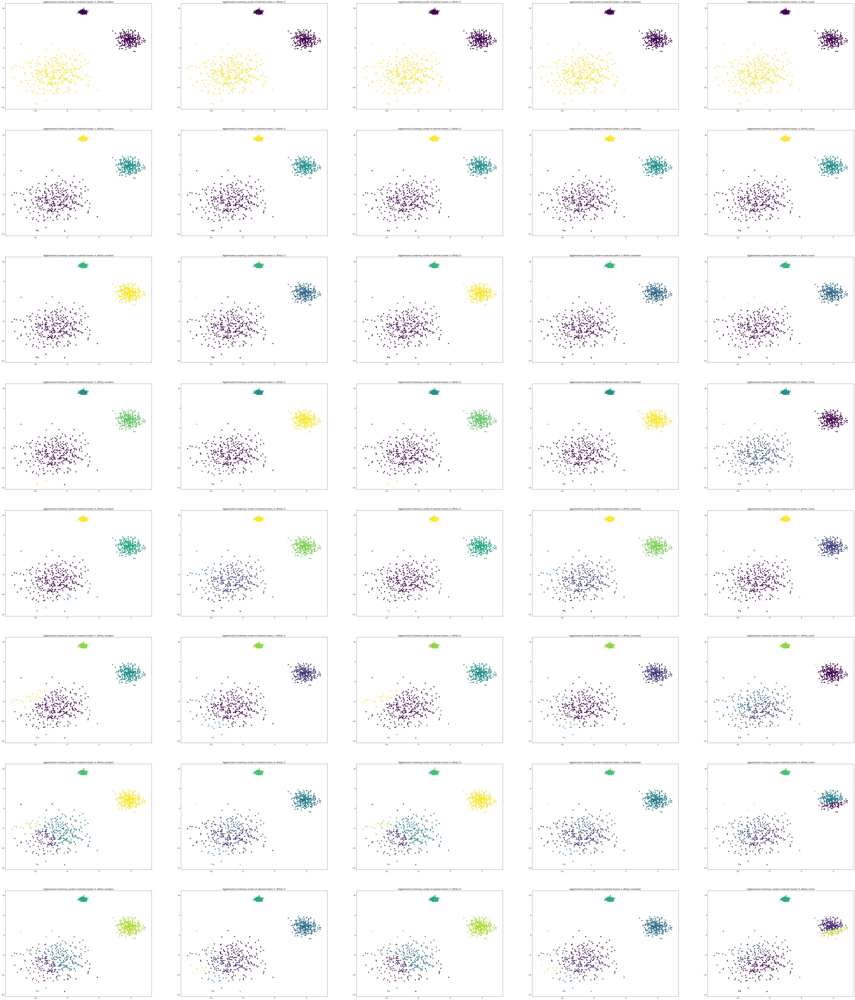

In [54]:
fig, axs = plt.subplots(nrows=len(clusters_range), ncols=len(distance_metrics), figsize=(100, 120))

idx = 0

for i, data_agg in enumerate(agglomerative_clustering_labels_mapping.items()):
    nclusters, data_dict = data_agg
    for j, data_agg1 in enumerate(data_dict.items()):
        affinity, labels = data_agg1
        colors_mapping = [(item/255.) for item in labels]
        axs[i][j].scatter(data[:, 0], data[:, 1], c=colors_mapping);
        axs[i][j].set_title('Agglomerative Clustering, number of selected clusters: {}, affinity: {}'.format(
            nclusters, affinity))

## AffinityPropagation Clustering

#### Experiments with damping

In [58]:
damping_range = np.arange(0.5, 1, 0.1)

In [59]:
affinity_labels_mapping = {}

metrics_dataframe_affinity = pd.DataFrame(index=damping_range, columns=clustering_metrics_titles)

for damping in damping_range:
    algorithm = AffinityPropagation(damping=damping)
    affinity_predictions = algorithm.fit_predict(data)
    
    affinity_labels_mapping[damping] = affinity_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_affinity.loc[damping, metric_title] = metric(labels, affinity_predictions)
        else:
            metrics_dataframe_affinity.loc[damping, metric_title] = metric(data, labels)

In [60]:
metrics_dataframe_affinity.index.name = 'damping'
metrics_dataframe_affinity

,homogeneity_score,silhouette_score,davies_bouldin_score,adjusted_rand_index,calinski_harabasz_score,adjusted_mutual_info,v_measure_score,completeness_score
damping,,,,,,,,
0.5,6.63434e-17,0.471177,0.860117,0,2551.13,1.21364e-16,1.32687e-16,1
0.6,6.63434e-17,0.471177,0.860117,0,2551.13,1.21364e-16,1.32687e-16,1
0.7,0.872257,0.471177,0.860117,0.707534,2551.13,0.716529,0.722426,0.616523
0.8,0.833165,0.471177,0.860117,0.691969,2551.13,0.700743,0.706644,0.613483
0.9,0.851002,0.471177,0.860117,0.746594,2551.13,0.742981,0.747772,0.666877


### Find best nclusters for each method

#### Davies_bouldin_score we have to minimize

In [61]:
metrics_dataframe_affinity[metrics_min].style.apply(highlight_min)

,davies_bouldin_score
damping,
0.5,0.860117
0.6,0.860117
0.7,0.860117
0.7999999999999999,0.860117
0.8999999999999999,0.860117


#### Other metrics we have to maximize

In [62]:
metrics_dataframe_affinity[metrics_max].style.apply(highlight_max)

,calinski_harabasz_score,adjusted_mutual_info,adjusted_rand_index,homogeneity_score,completeness_score,silhouette_score,v_measure_score
damping,,,,,,,
0.5,2551.134125,0.000000,0.000000,0.000000,1.000000,0.471177,0.000000
0.6,2551.134125,0.000000,0.000000,0.000000,1.000000,0.471177,0.000000
0.7,2551.134125,0.716529,0.707534,0.872257,0.616523,0.471177,0.722426
0.7999999999999999,2551.134125,0.700743,0.691969,0.833165,0.613483,0.471177,0.706644
0.8999999999999999,2551.134125,0.742981,0.746594,0.851002,0.666877,0.471177,0.747772


Seems like 0.9 damping is the best parameter for AffinityPropagation algorithm

### Vizualize clusters for each parameter

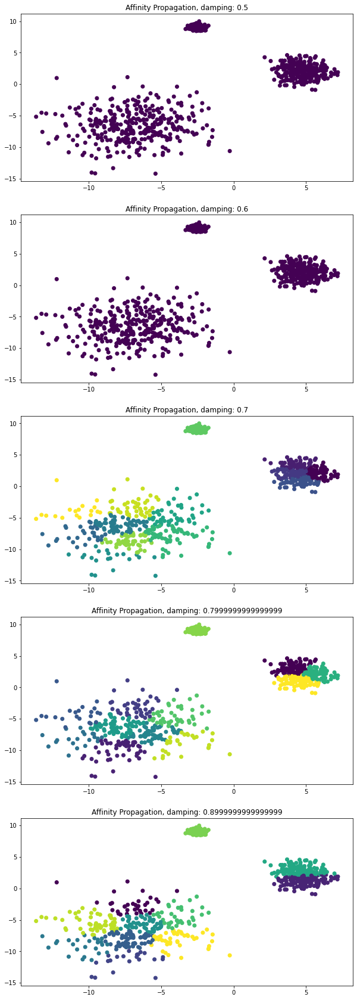

In [63]:
fig, axs = plt.subplots(nrows=len(damping_range), ncols=1, figsize=(10, 30))

idx = 0

for damping, labels in affinity_labels_mapping.items():
    colors_mapping = [(item/255.) for item in labels]
    axs[idx].scatter(data[:, 0], data[:, 1], c=colors_mapping);
    axs[idx].set_title('Affinity Propagation, damping: {}'.format(damping, ))
    
    idx += 1

## KMedoids Clustering

#### Experiments with number of clusters and distance metrics

In [64]:
clusters_range = range(2, 10)
distance_metrics = ('euclidean', 'l1', 'l2', 'manhattan', 'cosine')

In [65]:
kmedoids_clustering_labels_mapping = defaultdict(dict)

index = pd.MultiIndex.from_product((clusters_range, distance_metrics))

metrics_dataframe_kmedoids = pd.DataFrame(index=index, columns=clustering_metrics_titles)

In [66]:
for nclusters, distance_metric in itertools.product(clusters_range, distance_metrics):
    algorithm = KMedoids(n_clusters=nclusters, metric=distance_metric)
    kmedoids_predictions = algorithm.fit_predict(data)
    
    kmedoids_clustering_labels_mapping[nclusters][distance_metric] = kmedoids_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_kmedoids.loc[(nclusters, distance_metric), metric_title] = metric(
                labels, kmedoids_predictions)
        else:
            metrics_dataframe_kmedoids.loc[(nclusters, distance_metric), metric_title] = metric(data, labels)

In [67]:
metrics_dataframe_kmedoids.index.names = ['nclusters', 'affinity']
metrics_dataframe_kmedoids

homogeneity_score silhouette_score davies_bouldin_score  \
nclusters affinity                                                            
2         euclidean           0.31782         0.534405             0.840042   
          l1                  0.31782         0.534405             0.840042   
          l2                  0.31782         0.534405             0.840042   
          manhattan           0.31782         0.534405             0.840042   
          cosine              0.31782         0.534405             0.840042   
3         euclidean          0.548751         0.534405             0.840042   
          l1                 0.548751         0.534405             0.840042   
          l2                 0.548751         0.534405             0.840042   
          manhattan          0.548751         0.534405             0.840042   
          cosine             0.548751         0.534405             0.840042   
4         euclidean           0.62117         0.534405             0.840042   
          l1                 0.625747         0.534405             0.840042   
          l2                  0.62117         0.534405             0.840042   
          manhattan          0.625747         0.534405             0.840042   
          cosine             0.547042         0.534405             0.840042   
5         euclidean          0.722034         0.534405             0.840042   
          l1                 0.625747         0.534405             0.840042   
          l2                 0.722034         0.534405             0.840042   
          manhattan          0.625747         0.534405             0.840042   
          cosine             0.547312         0.534405             0.840042   
6         euclidean          0.684557         0.534405             0.840042   
          l1                 0.652165         0.534405             0.840042   
          l2                 0.684557         0.534405             0.840042   
          manhattan          0.652165         0.534405             0.840042   
          cosine             0.547639         0.534405             0.840042   
7         euclidean          0.674516         0.534405             0.840042   
          l1                 0.747844         0.534405             0.840042   
          l2                 0.674516         0.534405             0.840042   
          manhattan          0.747844         0.534405             0.840042   
          cosine             0.547723         0.534405             0.840042   
8         euclidean          0.675655         0.534405             0.840042   
          l1                 0.726013         0.534405             0.840042   
          l2                 0.675655         0.534405             0.840042   
          manhattan          0.726013         0.534405             0.840042   
          cosine             0.548381         0.534405             0.840042   
9         euclidean          0.677515         0.534405             0.840042   
          l1                 0.768191         0.534405             0.840042   
          l2                 0.677515         0.534405             0.840042   
          manhattan          0.768191         0.534405             0.840042   
          cosine             0.548381         0.534405             0.840042   

                    adjusted_rand_index calinski_harabasz_score  \
nclusters affinity                                                
2         euclidean            0.302017                 5320.91   
          l1                   0.302017                 5320.91   
          l2                   0.302017                 5320.91   
          manhattan            0.302017                 5320.91   
          cosine               0.302017                 5320.91   
3         euclidean            0.616497                 5320.91   
          l1                   0.616497                 5320.91   
          l2                   0.616497                 5320.91   
          manhattan            

### Find best nclusters and affinity for KMedoids Clustering

#### Davies_bouldin_score we have to minimize

In [68]:
metrics_dataframe_kmedoids[metrics_min].style.apply(highlight_min)

#### Other metrics we have to maximize

In [69]:
metrics_dataframe_kmedoids[metrics_max].style.apply(highlight_max)

Seems like 5 clusters and Euclidean or L2 are the best for KMedoids Clustering algorithm

### Vizualize clusters for each parameter

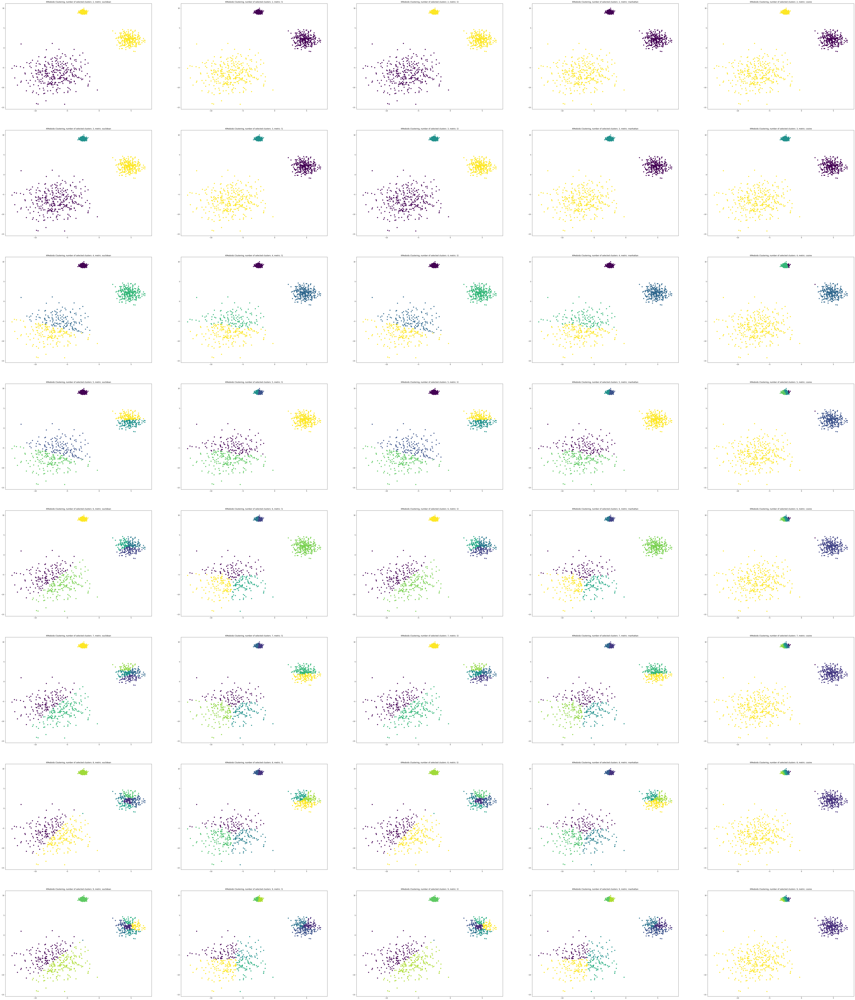

In [70]:
fig, axs = plt.subplots(nrows=len(clusters_range), ncols=len(distance_metrics), figsize=(100, 120))

idx = 0

for i, data_agg in enumerate(kmedoids_clustering_labels_mapping.items()):
    nclusters, data_dict = data_agg
    for j, data_agg1 in enumerate(data_dict.items()):
        metric, labels = data_agg1
        colors_mapping = [(item/255.) for item in labels]
        axs[i][j].scatter(data[:, 0], data[:, 1], c=colors_mapping);
        axs[i][j].set_title('KMedoids Clustering, number of selected clusters: {}, metric: {}'.format(
            nclusters, metric))